In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/data-science-london-scikit-learn/trainLabels.csv
/kaggle/input/data-science-london-scikit-learn/train.csv
/kaggle/input/data-science-london-scikit-learn/test.csv


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

In [3]:
train=pd.read_csv('/kaggle/input/data-science-london-scikit-learn/train.csv')
y=pd.read_csv('/kaggle/input/data-science-london-scikit-learn/trainLabels.csv')
test=pd.read_csv('/kaggle/input/data-science-london-scikit-learn/test.csv')
train

,0.29940251144353242,-1.2266241875260637,1.4984250500215328,-1.1761503610375272,5.2898525545597037,0.20829711393323402,2.4044983672405826,1.5945062220589785,-0.051608163273514231,0.66323431039687908,...,-0.85046544625016463,-0.62298999638261954,-1.8330573433160038,0.29302438506869571,3.5526813410266507,0.71761099417552265,3.3059719748508889,-2.7155588147154619,-2.6824085866346223,0.10105047232890663
0,-1.174176,0.332157,0.949919,-1.285328,2.199061,-0.151268,-0.427039,2.619246,-0.765884,-0.093780,...,-0.819750,0.012037,2.038836,0.468579,-0.517657,0.422326,0.803699,1.213219,1.382932,-1.817761
1,1.192222,-0.414371,0.067054,-2.233568,3.658881,0.089007,0.203439,-4.219054,-1.184919,-1.240310,...,-0.604501,0.750054,-3.360521,0.856988,-2.751451,-1.582735,1.672246,0.656438,-0.932473,2.987436
2,1.573270,-0.580318,-0.866332,-0.603812,3.125716,0.870321,-0.161992,4.499666,1.038741,-1.092716,...,1.022959,1.275598,-3.480110,-1.065252,2.153133,1.563539,2.767117,0.215748,0.619645,1.883397
3,-0.613071,-0.644204,1.112558,-0.032397,3.490142,-0.011935,1.443521,-4.290282,-1.761308,0.807652,...,0.513906,-1.803473,0.518579,-0.205029,-4.744566,-1.520015,1.830651,0.870772,-1.894609,0.408332
4,-0.773247,-0.123227,0.047423,-0.210266,10.377793,0.526604,-2.751616,0.315541,0.608603,-0.043421,...,-1.487714,0.792790,-0.540711,0.114115,-0.277477,-0.896411,-2.805207,0.469162,3.614157,0.081689
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,-0.310429,0.826811,-0.952245,0.768850,1.877520,1.320646,1.944609,1.191420,-0.127724,0.070937,...,-0.600411,-0.383792,0.745596,-0.698598,-2.729937,-0.431535,0.372873,1.019092,-2.672811,-0.295141
995,-1.853879,0.246726,0.459921,-2.074267,7.599220,-0.138355,-4.501900,0.630634,-1.590533,-1.112949,...,0.361736,0.240052,-0.856196,-0.072481,-2.935896,0.582411,-2.613407,0.036687,2.809310,4.412567
996,0.912748,-1.734039,-1.047035,0.217573,13.457812,0.162771,-2.250521,2.216161,-0.378326,0.642114,...,1.195896,-1.073806,-2.754369,1.814864,-4.190105,-1.116441,-2.100125,0.061513,0.895536,0.813686
997,2.439780,-0.735511,-0.902426,1.365036,-10.430299,-0.856859,2.686474,0.292035,0.585388,-0.876965,...,2.262326,-0.039488,0.773876,-0.916066,2.604827,-0.649874,-3.423674,0.229748,-2.311088,-3.422217


# Information about Data

In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   0.29940251144353242    999 non-null    float64
 1   -1.2266241875260637    999 non-null    float64
 2   1.4984250500215328     999 non-null    float64
 3   -1.1761503610375272    999 non-null    float64
 4   5.2898525545597037     999 non-null    float64
 5   0.20829711393323402    999 non-null    float64
 6   2.4044983672405826     999 non-null    float64
 7   1.5945062220589785     999 non-null    float64
 8   -0.051608163273514231  999 non-null    float64
 9   0.66323431039687908    999 non-null    float64
 10  -1.4083700642531511    999 non-null    float64
 11  1.1147436351160869     999 non-null    float64
 12  0.91041530967390116    999 non-null    float64
 13  2.2181103179158135     999 non-null    float64
 14  4.3056427290235391     999 non-null    float64
 15  0.0889

# Number of Unique Values in each columns

In [5]:
train.nunique()

0.29940251144353242      999
-1.2266241875260637      999
1.4984250500215328       999
-1.1761503610375272      999
5.2898525545597037       999
0.20829711393323402      999
2.4044983672405826       999
1.5945062220589785       999
-0.051608163273514231    999
0.66323431039687908      999
-1.4083700642531511      999
1.1147436351160869       999
0.91041530967390116      999
2.2181103179158135       999
4.3056427290235391       999
0.088923978050666208     999
0.1691492586690862       999
0.41344763764684195      999
1.5138621708864943       999
2.6629665829474161       999
-1.0727654812214888      999
0.14911112051014644      999
0.55957919164070269      999
4.3788846423749064       999
-0.4636026556416834      999
-0.063959155289009084    999
0.54493030536966891      999
0.71277166708074502      999
-1.4940501263538932      999
-2.6361688752136554      999
-0.85046544625016463     999
-0.62298999638261954     999
-1.8330573433160038      999
0.29302438506869571      999
3.552681341026

# Consider Inf Value as NAN for entire notebook

In [6]:
pd.set_option('mode.use_inf_as_na', True)

# Columns having Null Values

In [7]:
null_train=train.columns[train.isnull().any()]
null_train

Index([], dtype='object')

In [8]:
null_test=test.columns[test.isnull().any()]
null_test

Index([], dtype='object')

So, there are NO-NAN values...GOOD THING !

# Plotting Histogram to see distribution of features

In [9]:
import plotly.express as px
for col in train.columns: 
    fig = px.histogram(train, x=train[col],marginal="rug")
    fig.show()

All Features are Normally Distributed...GOOD THING !

In [10]:
import plotly.express as px
fig = px.histogram(y, x="1",marginal="rug",facet_col='1')
fig.show()

Even the Target is  EVENLY Distrubuted

# ScatterPlot

Plots the relation between EACH Pair

In [11]:
import plotly.express as px

for col in train.columns:
    fig = px.scatter(train, x=train[col], y=y['1'])
    fig.show()

ALL Features are Positively Correlated...

# DistPlot to confirm Distribution of each Features

In [12]:
import plotly.figure_factory as ff

fig = ff.create_distplot([train[c] for c in train.columns], train.columns, bin_size=0.5,curve_type='normal')
fig.show()

/opt/conda/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning:

The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.



all Features are NORMALLY DISTRBUTED...confirmed,,,Good Thing !

# Heatmap
Checks the Correlation among ALL Features

In [13]:
import plotly.express as px
fig = px.imshow(train.corr(), text_auto=True,aspect="auto")
fig.show()

# 2D Histogram

To see relation between EACH Feature and Target Variable

In [14]:
import plotly.express as px

for col in train.columns:
    fig = px.density_heatmap(train, x=train[col],y=y['1'], marginal_x="histogram", marginal_y="histogram")
    fig.show()

# Boxplot
Vizualize the Distribution of Features

In [15]:
import plotly.express as px

for col in train.columns:
    fig = px.box(train, y=train[col], color=y['1'],points="all")
    fig.show()

**From the EDAs the following can be observed :-**
1. All Features are numeric - no need of Label Encoding
2. All Features are Normally Distributed & Unimodal - no need of Log / Box-Cox Transformations
3. Boxplot reveals presence of some Minor Outliers - we may be FINE including these, but I choose to get rid of these for sake of accuracy

# Removing Outliers

In statistics, an outlier is a data point that differs significantly from other observations. An outlier may be due to variability in the measurement or it may indicate experimental error; the latter are sometimes excluded from the data set. An outlier can cause serious problems in statistical analyses.

In [16]:
# Using Isolation Forest
from sklearn.ensemble import IsolationForest
iso = IsolationForest(contamination=0.3)

out = iso.fit_predict(train)

# select all rows that are not outliers
train[out != -1]
train

/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



,0.29940251144353242,-1.2266241875260637,1.4984250500215328,-1.1761503610375272,5.2898525545597037,0.20829711393323402,2.4044983672405826,1.5945062220589785,-0.051608163273514231,0.66323431039687908,...,-0.85046544625016463,-0.62298999638261954,-1.8330573433160038,0.29302438506869571,3.5526813410266507,0.71761099417552265,3.3059719748508889,-2.7155588147154619,-2.6824085866346223,0.10105047232890663
0,-1.174176,0.332157,0.949919,-1.285328,2.199061,-0.151268,-0.427039,2.619246,-0.765884,-0.093780,...,-0.819750,0.012037,2.038836,0.468579,-0.517657,0.422326,0.803699,1.213219,1.382932,-1.817761
1,1.192222,-0.414371,0.067054,-2.233568,3.658881,0.089007,0.203439,-4.219054,-1.184919,-1.240310,...,-0.604501,0.750054,-3.360521,0.856988,-2.751451,-1.582735,1.672246,0.656438,-0.932473,2.987436
2,1.573270,-0.580318,-0.866332,-0.603812,3.125716,0.870321,-0.161992,4.499666,1.038741,-1.092716,...,1.022959,1.275598,-3.480110,-1.065252,2.153133,1.563539,2.767117,0.215748,0.619645,1.883397
3,-0.613071,-0.644204,1.112558,-0.032397,3.490142,-0.011935,1.443521,-4.290282,-1.761308,0.807652,...,0.513906,-1.803473,0.518579,-0.205029,-4.744566,-1.520015,1.830651,0.870772,-1.894609,0.408332
4,-0.773247,-0.123227,0.047423,-0.210266,10.377793,0.526604,-2.751616,0.315541,0.608603,-0.043421,...,-1.487714,0.792790,-0.540711,0.114115,-0.277477,-0.896411,-2.805207,0.469162,3.614157,0.081689
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,-0.310429,0.826811,-0.952245,0.768850,1.877520,1.320646,1.944609,1.191420,-0.127724,0.070937,...,-0.600411,-0.383792,0.745596,-0.698598,-2.729937,-0.431535,0.372873,1.019092,-2.672811,-0.295141
995,-1.853879,0.246726,0.459921,-2.074267,7.599220,-0.138355,-4.501900,0.630634,-1.590533,-1.112949,...,0.361736,0.240052,-0.856196,-0.072481,-2.935896,0.582411,-2.613407,0.036687,2.809310,4.412567
996,0.912748,-1.734039,-1.047035,0.217573,13.457812,0.162771,-2.250521,2.216161,-0.378326,0.642114,...,1.195896,-1.073806,-2.754369,1.814864,-4.190105,-1.116441,-2.100125,0.061513,0.895536,0.813686
997,2.439780,-0.735511,-0.902426,1.365036,-10.430299,-0.856859,2.686474,0.292035,0.585388,-0.876965,...,2.262326,-0.039488,0.773876,-0.916066,2.604827,-0.649874,-3.423674,0.229748,-2.311088,-3.422217


In [17]:
# out = iso.fit_predict(test)

# # select all rows that are not outliers
# test[out != -1
# test

# Train Test Split

It splits the train data into 4 parts, X_train, X_test, y_train, y_test.

* X_train, y_train first used to train the algorithm.
* X_test is used in that trained algorithms to predict outcomes.
* Once we get the outcomes, we compare it with y_test


In [18]:
X=train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
X_train
# X_test
# y_train
# y_test

,0.29940251144353242,-1.2266241875260637,1.4984250500215328,-1.1761503610375272,5.2898525545597037,0.20829711393323402,2.4044983672405826,1.5945062220589785,-0.051608163273514231,0.66323431039687908,...,-0.85046544625016463,-0.62298999638261954,-1.8330573433160038,0.29302438506869571,3.5526813410266507,0.71761099417552265,3.3059719748508889,-2.7155588147154619,-2.6824085866346223,0.10105047232890663
379,-0.353750,-1.262783,0.212309,-0.599746,2.530698,0.451819,1.564142,-1.448257,1.252185,0.924943,...,0.308053,0.358634,-2.544812,-0.541069,1.347861,0.294572,1.738863,0.339783,-1.421496,-0.460493
285,0.733037,-0.147103,0.878043,-0.565312,-3.564498,0.520578,-1.243149,-1.654122,0.087484,0.878785,...,0.287282,0.144744,-0.655242,-0.042774,-0.458307,-0.464624,-3.109730,-1.721390,-0.639986,1.774623
28,-1.392992,1.138244,-0.754107,-1.057505,-3.003864,0.217549,0.001129,1.240812,-0.770707,1.828583,...,-0.178514,-1.210527,-0.587721,-0.559876,3.133772,1.225828,-1.870699,-2.315177,-2.320320,-2.200035
46,0.188347,1.153727,-0.639081,-0.152208,-2.957341,0.312346,2.288861,-2.120069,1.400781,0.920800,...,-0.790923,0.476498,1.887482,0.792874,3.675173,0.882673,5.936391,-0.330847,-2.136527,-3.884789
848,-1.968344,-0.059112,-0.438654,-0.616662,-4.837931,-0.379368,0.495266,-0.006147,-0.560315,0.104569,...,-2.082314,0.836208,3.947089,0.398853,-0.941737,-1.478043,2.653165,2.164140,-0.857682,2.545192
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
888,-0.721912,-1.271893,-0.537988,-0.359074,4.352506,0.419928,0.207016,-0.023857,-1.026936,-1.128069,...,0.563020,-1.416304,0.491994,1.444564,-1.583328,0.451047,1.723488,-0.885530,-3.723937,0.158963
509,1.626777,-2.170632,0.074971,-2.410888,-0.430972,0.144373,-0.790706,2.801246,0.405227,-1.600360,...,1.303528,-0.152634,-3.144012,-0.466813,0.811482,-0.208931,0.356053,-0.148395,-1.444950,1.281390
745,0.638965,0.747267,-0.483657,1.298078,-2.164395,0.737657,1.734886,-0.320840,0.096242,-2.361848,...,-0.258281,-1.466258,-1.055726,1.918783,0.867341,-1.306889,2.334987,1.923016,-0.148139,2.958636
678,1.264460,-0.296032,0.280685,-1.398312,-4.134463,0.364641,2.382113,0.853318,-0.144287,-0.205053,...,0.421657,0.256942,-3.663669,-0.892153,2.400326,-0.893175,1.879887,-0.509527,0.290807,3.365894


# Train & Fit XGB Model

To know more about XGB HyperParameters check ;- https://www.kaggle.com/code/pythonkumar/xgboost-hyperparameters-excellent-plots-acc-91?scriptVersionId=94478268&cellId=70

In [19]:
from xgboost import XGBClassifier
model = XGBClassifier(
    booster='gbtree', 
    objective='binary:logistic', 
    eval_metric='logloss',
    n_estimators=1000,
    max_depth=15,
    min_split_loss=0.1,
    learning_rate=0.05,
    reg_alpha=0.5,
    reg_lambda=0.5)

model.fit(X_train, y_train)

model.get_params()

{'objective': 'binary:logistic',
 'use_label_encoder': False,
 'base_score': 0.5,
 'booster': 'gbtree',
 'callbacks': None,
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': 'logloss',
 'gamma': 0.100000001,
 'gpu_id': -1,
 'grow_policy': 'depthwise',
 'importance_type': None,
 'interaction_constraints': '',
 'learning_rate': 0.05,
 'max_bin': 256,
 'max_cat_to_onehot': 4,
 'max_delta_step': 0,
 'max_depth': 15,
 'max_leaves': 0,
 'min_child_weight': 1,
 'missing': nan,
 'monotone_constraints': '()',
 'n_estimators': 1000,
 'n_jobs': 0,
 'num_parallel_tree': 1,
 'predictor': 'auto',
 'random_state': 0,
 'reg_alpha': 0.5,
 'reg_lambda': 0.5,
 'sampling_method': 'uniform',
 'scale_pos_weight': 1,
 'subsample': 1,
 'tree_method': 'exact',
 'validate_parameters': 1,
 'verbosity': None,
 'min_split_loss': 0.1}

# Predicting from XGB Model

In [20]:
pred=model.predict(X_test)
pred

array([0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0,
       1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1,
       0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0,
       0, 1])

# Scoring - Confusion Matrix

In [21]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,pred)

from sklearn.metrics import ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=model.classes_)
cm

array([[87, 13],
       [10, 90]])

# Scoring - F1 Score

In [22]:
from sklearn.metrics import f1_score
f1_score(y_test, pred)

0.8866995073891626

# Feature Importance

In [23]:
# get importance
importance = model.feature_importances_

# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))

Feature: 0, Score: 0.01026
Feature: 1, Score: 0.00943
Feature: 2, Score: 0.01879
Feature: 3, Score: 0.01486
Feature: 4, Score: 0.04382
Feature: 5, Score: 0.01860
Feature: 6, Score: 0.03258
Feature: 7, Score: 0.01559
Feature: 8, Score: 0.01183
Feature: 9, Score: 0.01597
Feature: 10, Score: 0.01896
Feature: 11, Score: 0.01788
Feature: 12, Score: 0.15826
Feature: 13, Score: 0.01194
Feature: 14, Score: 0.08878
Feature: 15, Score: 0.01287
Feature: 16, Score: 0.01035
Feature: 17, Score: 0.01263
Feature: 18, Score: 0.03837
Feature: 19, Score: 0.00861
Feature: 20, Score: 0.01090
Feature: 21, Score: 0.01590
Feature: 22, Score: 0.02905
Feature: 23, Score: 0.02571
Feature: 24, Score: 0.01350
Feature: 25, Score: 0.01517
Feature: 26, Score: 0.02049
Feature: 27, Score: 0.01103
Feature: 28, Score: 0.01976
Feature: 29, Score: 0.03034
Feature: 30, Score: 0.01025
Feature: 31, Score: 0.01513
Feature: 32, Score: 0.03417
Feature: 33, Score: 0.01641
Feature: 34, Score: 0.02898
Feature: 35, Score: 0.01209
Fe

# Plotting Feature Importance

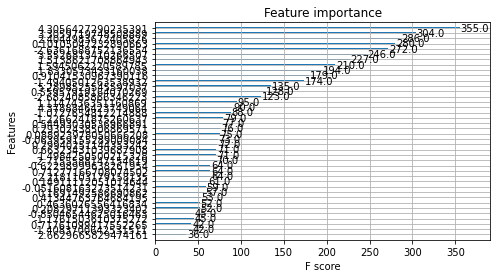

In [24]:
# plot
import matplotlib.pyplot as plt
from xgboost import plot_importance
plot_importance(model)
plt.show()

# Suggestions:-
* Kaggle - https://www.kaggle.com/pythonkumar
* GitHub - https://github.com/KumarPython​
* Twitter - https://twitter.com/KumarPython
* LinkedIn - https://www.linkedin.com/in/kumarpython/

# Submission

In [25]:
submission=pd.DataFrame({'Id': [i for i in range (1, len(test)+1)],
                         'Solution':model.predict(test)})
# submission
submission.to_csv('submission.csv', index=False)